# Analysis dataset Galapagos Radiation

In [3]:
os.chdir('/home/h/hollenberg/masterpraktikum_fibrosis_atlas/')
os.getcwd()

'/home/h/hollenberg/masterpraktikum_fibrosis_atlas'

In [4]:
import scanpy as sc
import os
import gzip
import shutil
from tqdm.notebook import tqdm
import anndata
import matplotlib.pyplot as plt
from IPython.display import Image
import numpy as np
import seaborn as sns
from scipy.stats import median_abs_deviation
#import anndata2ri
import logging
import pandas as pd
import source.utils as utils
from tqdm.autonotebook import tqdm
import scrublet

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)
plt.rcParams['figure.figsize'] = (7, 7)

## Load data

In [5]:
path = "/home/h/hollenberg/MaPra/"
adata = sc.read(os.path.join(path, "radiation.h5ad"))

In [6]:
print("Number of cells: ", adata.n_obs)
print("Number of genes: ", adata.n_vars)

Number of cells:  414668
Number of genes:  23746


In [31]:
adata.obs

,Row.names,orig.ident,nCount_RNA,nFeature_RNA,ambient_RNA,percent_mito,percent_ribo,S.Score,G2M.Score,Phase,...,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier
RADsc_A1_AAACCCACAACTCGTA-1,AAACCCACAACTCGTA-1,RADsc_A1,2711.0,1215,3.797064,5.717447,26.374032,0.092329,0.091092,S,...,5.049856,5.717447,715.0,6.573680,26.374033,5.0,1.791759,0.184434,False,False
RADsc_A1_AAACCCATCATTGTTC-1,AAACCCATCATTGTTC-1,RADsc_A1,2816.0,1372,6.432644,4.083807,16.477273,0.070975,-0.062902,S,...,4.753590,4.083807,464.0,6.142037,16.477274,5.0,1.791759,0.177557,False,False
RADsc_A1_AAACCCATCGGTCATA-1,AAACCCATCGGTCATA-1,RADsc_A1,3837.0,1392,5.005817,2.058900,2.892885,-0.000484,0.075893,G2M,...,4.382027,2.058900,111.0,4.718499,2.892885,3.0,1.386294,0.078186,False,False
RADsc_A1_AAACCCATCTGTAAGC-1,AAACCCATCTGTAAGC-1,RADsc_A1,4510.0,1763,3.267321,5.432373,30.044346,-0.014309,0.011987,G2M,...,5.505332,5.432373,1355.0,7.212295,30.044348,4.0,1.609438,0.088692,False,False
RADsc_A1_AAACGAAAGCCGATAG-1,AAACGAAAGCCGATAG-1,RADsc_A1,5702.0,2363,4.091238,5.243774,19.712382,-0.019251,-0.133930,G1,...,5.703783,5.243774,1124.0,7.025538,19.712381,0.0,0.000000,0.000000,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RADsc_H9_TTTGGTTCAACTGAAA-1,TTTGGTTCAACTGAAA-1,RADsc_H9,20895.0,5055,9.541838,7.360613,10.638909,0.668061,0.588553,S,...,7.338888,7.360612,2223.0,7.707063,10.638909,2.0,1.098612,0.009572,False,False
RADsc_H9_TTTGGTTCATCCGGTG-1,TTTGGTTCATCCGGTG-1,RADsc_H9,25350.0,4981,1.012483,3.289941,9.739645,-0.038825,-0.068234,G1,...,6.727432,3.289941,2469.0,7.811974,9.739645,4.0,1.609438,0.015779,False,False
RADsc_H9_TTTGGTTTCCCTGGTT-1,TTTGGTTTCCCTGGTT-1,RADsc_H9,1846.0,812,7.725337,6.175515,35.102925,-0.008665,0.000511,G2M,...,4.744932,6.175515,648.0,6.475433,35.102924,3.0,1.386294,0.162514,False,False
RADsc_H9_TTTGTTGAGGAAGTGA-1,TTTGTTGAGGAAGTGA-1,RADsc_H9,1487.0,562,4.617912,7.061197,46.334902,0.015747,0.020634,G2M,...,4.663439,7.061197,689.0,6.536692,46.334900,1.0,0.693147,0.067249,False,False


### Quality Control

In [8]:
adata.var_names_make_unique()
adata.obs_names_make_unique()
adata

AnnData object with n_obs × n_vars = 414668 × 23746
    obs: 'Row.names', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'ambient_RNA', 'percent_mito', 'percent_ribo', 'S.Score', 'G2M.Score', 'Phase', 'DF_doublet_score', 'DF_call_10pct', 'DF_call_1pct', 'DF_prediction', 'tube_ID', 'SAMP_ID', 'PROJ_bioinf_id', 'PROJ_glpg_id', 'PROJ_area', 'PROJ_species', 'PROJ_tissue', 'PROJ_tissue_detail', 'PROJ_biological_system', 'SAMP_subject_ID', 'SAMP_condition', 'SAMP_treatment', 'SAMP_stage', 'SAMP_exp_group', 'SAMP_sex', 'macrogen_sample_no', 'cell_conc_perml', 'cell_viability_pct', 'aggregates_pct', 'SC_prep', 'library_conc_ng_ul', 'library_size_bp', 'dataset', 'BW_sacrifice_g', 'perc_BW_change_rdm', 'col1_area_pct', 'MitochondrialRatio', 'RibosomalRatio', 'nCount_SCT', 'nFeature_SCT', 'clust_res0.6', 'clust_res0.9', 'clust_res1.2', 'clust_res1.5', 'ident'
    obsm: 'X_pca', 'X_umap'
    layers: 'logcounts'

In [9]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith(("MT-", "mt-", "Mt-"))
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]|^hb[^(p)]|^Hb[^(p)]"))


print(adata.var["mt"].value_counts())
print(adata.var["ribo"].value_counts())
print(adata.var["hb"].value_counts())

mt
False    23733
True        13
Name: count, dtype: int64
ribo
False    23643
True       103
Name: count, dtype: int64
hb
False    23735
True        11
Name: count, dtype: int64


In [10]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)

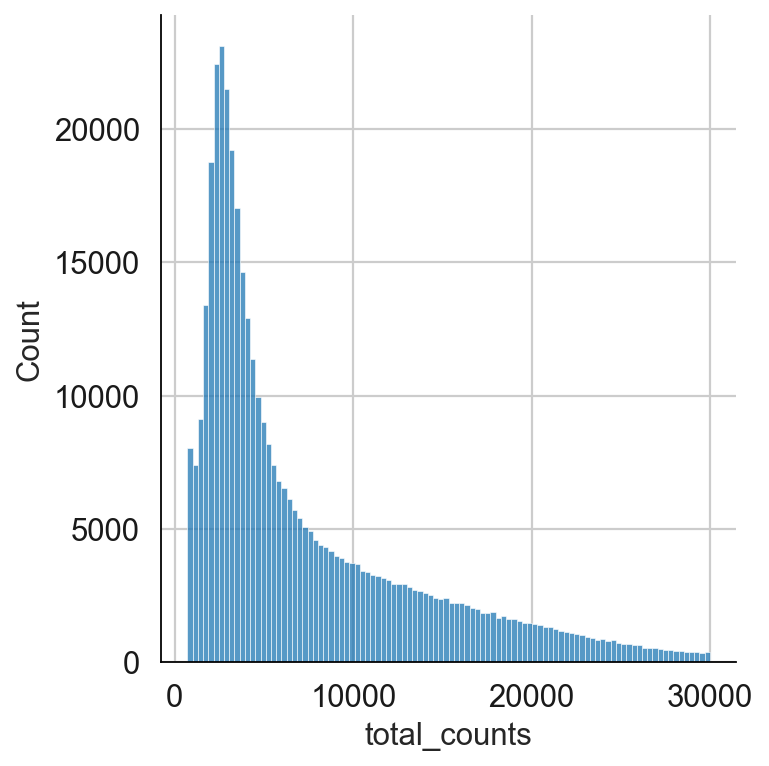

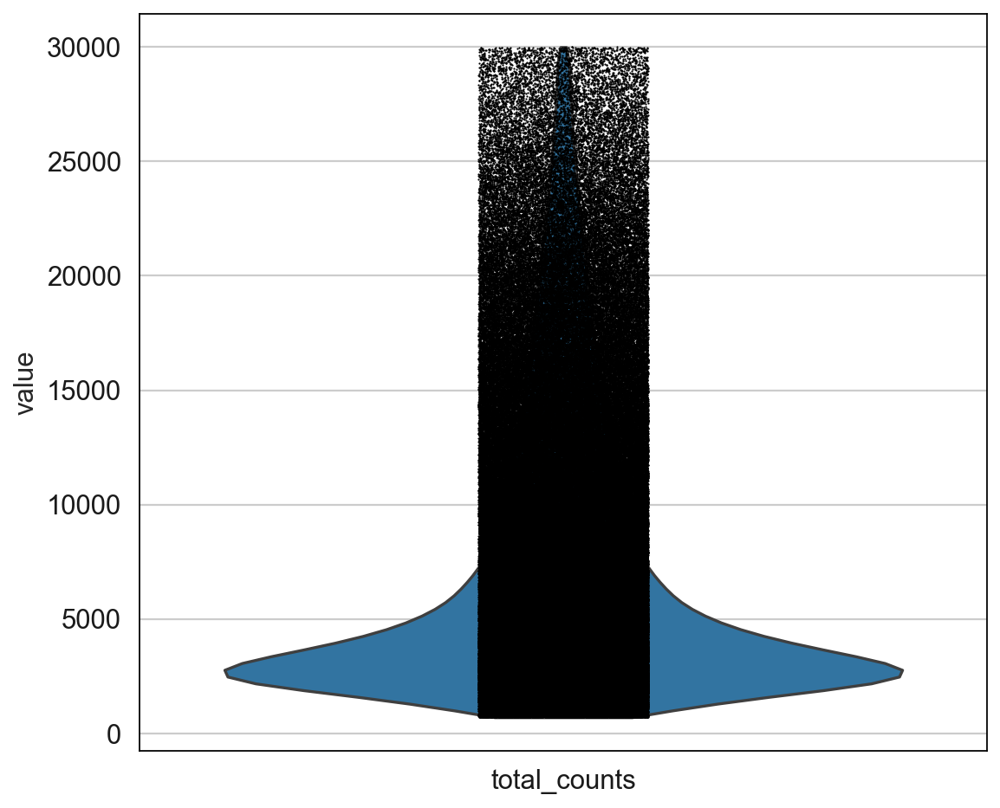

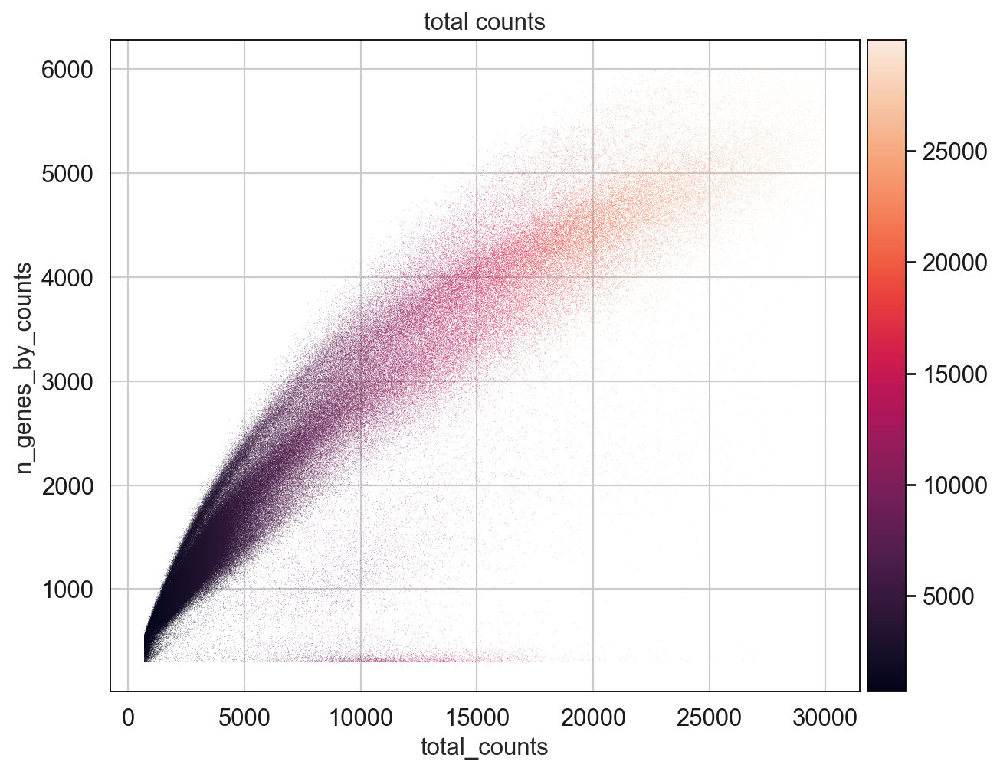

In [11]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
p2 = sc.pl.violin(adata, 'total_counts')
#p2 = sc.pl.violin(adata_raw, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="total_counts")

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


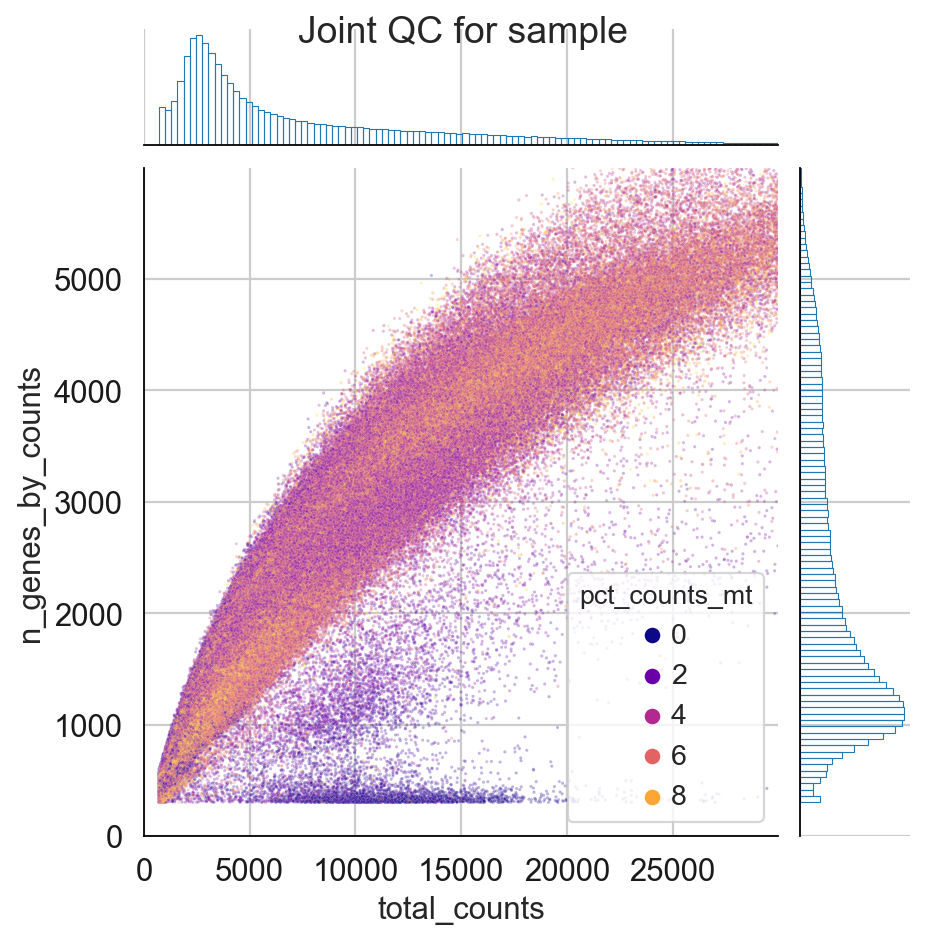

In [12]:
utils.plot_qc_joint(adata, x="total_counts",
                    y='n_genes_by_counts',
                    hue='pct_counts_mt',
                    palette='plasma',
                    #x_threshold=(0, 3000),   # total_counts
                    #y_threshold=(50, 40000),    # n_genes_by_counts
                    title='Joint QC for sample')

In [13]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [14]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

outlier
False    387856
True      26812
Name: count, dtype: int64

In [15]:
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 8
)
adata.obs.mt_outlier.value_counts()

mt_outlier
False    360981
True      53687
Name: count, dtype: int64

In [16]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 414668
Number of cells after filtering of low quality cells: 343071


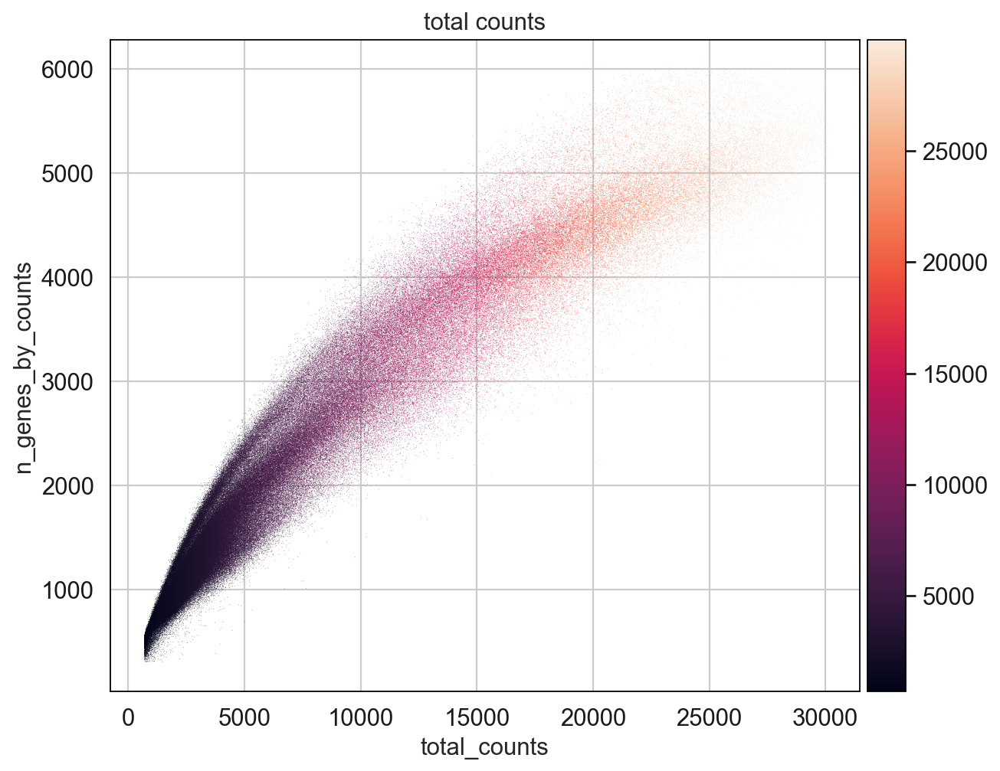

In [17]:
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="total_counts")

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


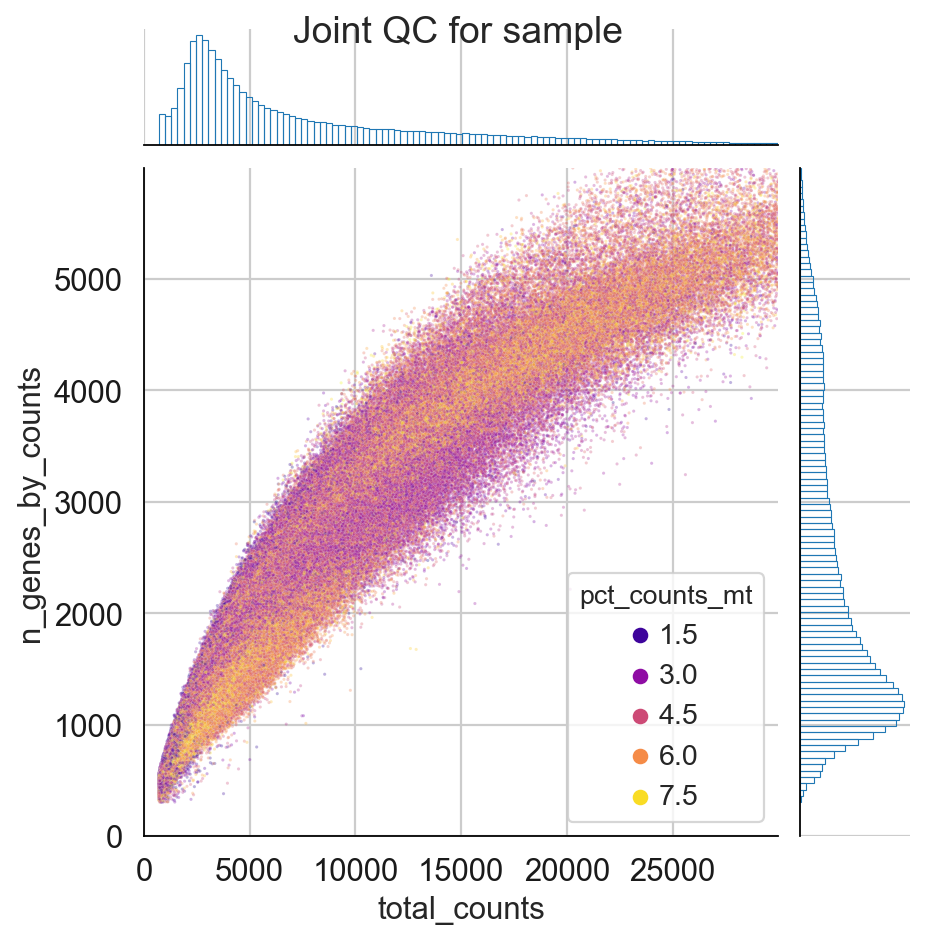

In [18]:
# plot after selection
utils.plot_qc_joint(adata, x="total_counts",
                    y='n_genes_by_counts',
                    hue='pct_counts_mt',
                    palette='plasma',
                    #x_threshold=(500, 40000),  # total_counts
                    #y_threshold=(0, 30000),  # n_genes_by_counts
                    title='Joint QC for sample ')

### Normalization

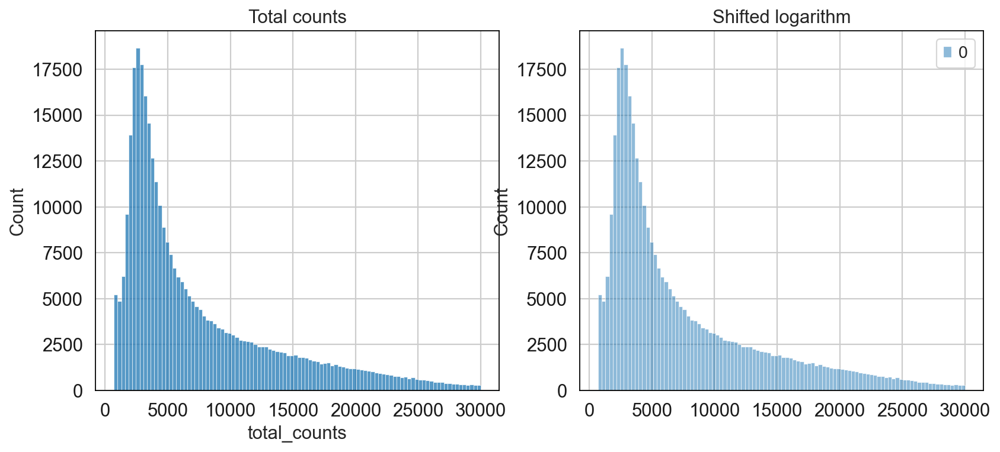

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["logcounts"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

layer logcounts no log ???

In [21]:
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)
adata.X = adata.layers['log1p_norm']

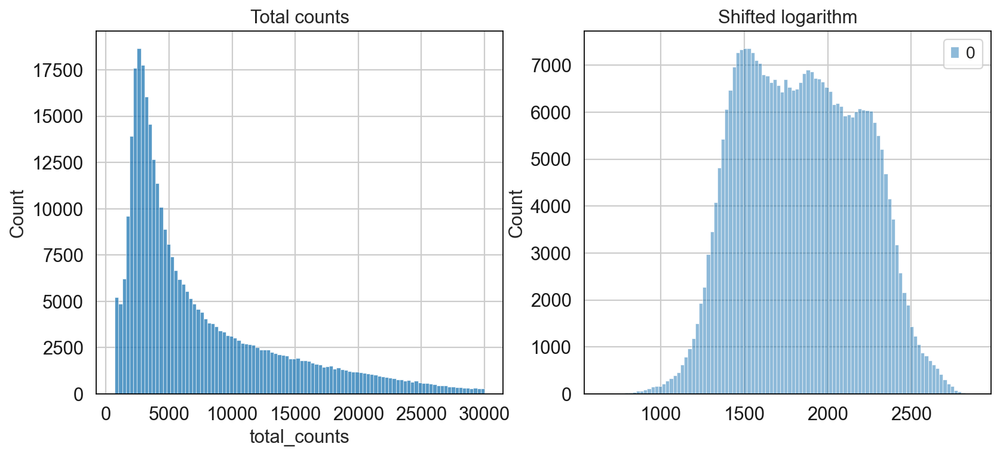

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [69]:
adata_raw.write("/home/h/hollenberg/MaPra/adata_processed_lea.h5ad")

In [70]:
adata = sc.read("/home/h/hollenberg/MaPra/adata_processed_lea.h5ad")

### Dimensionality Reduction

In [24]:
# already calculated
#sc.pp.pca(adata)
#sc.pp.neighbors(adata)
#sc.tl.umap(adata)

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


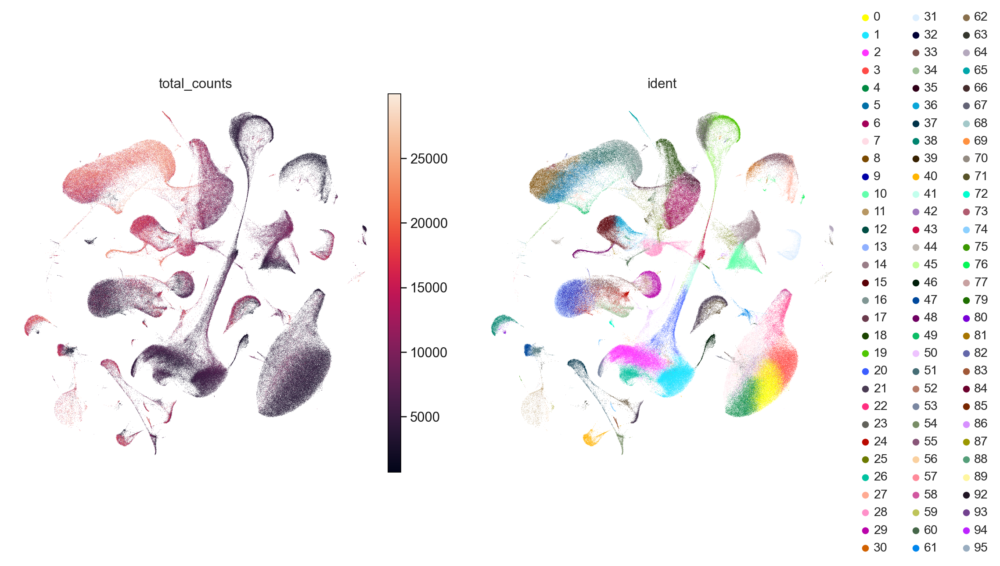

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


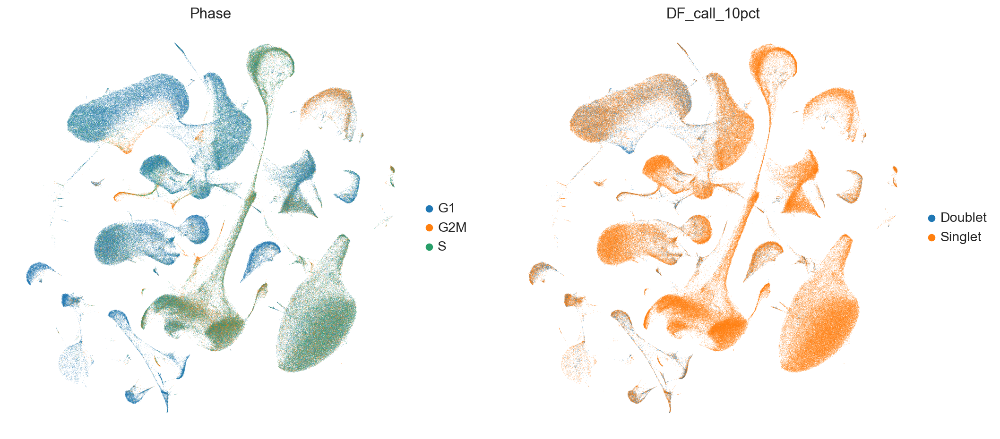

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


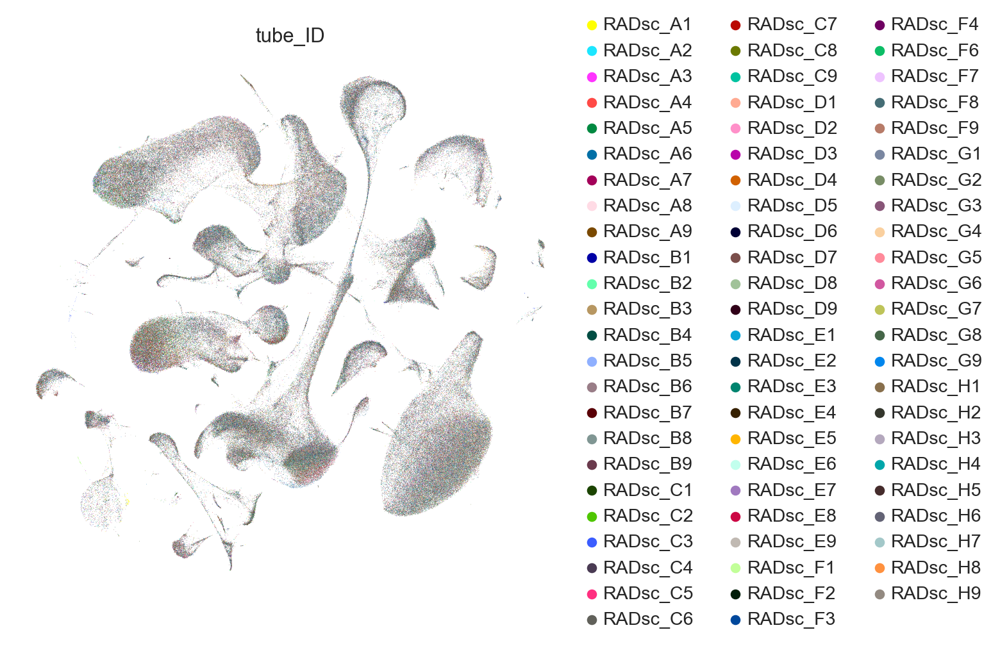

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


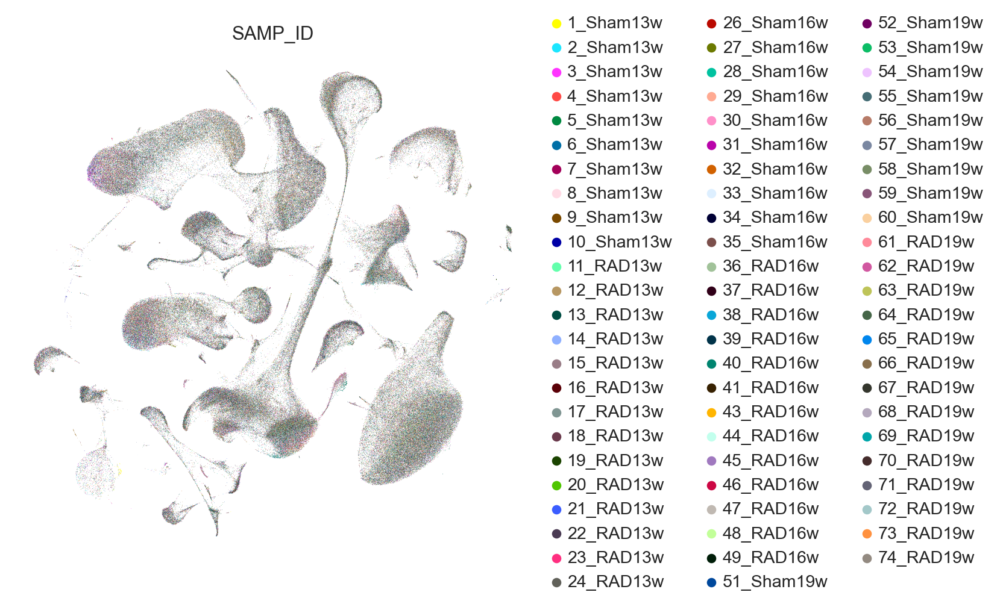

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


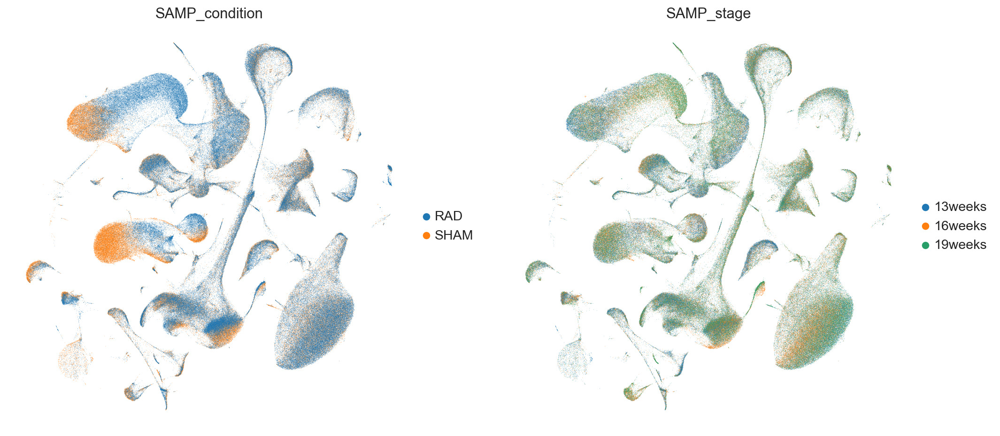

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


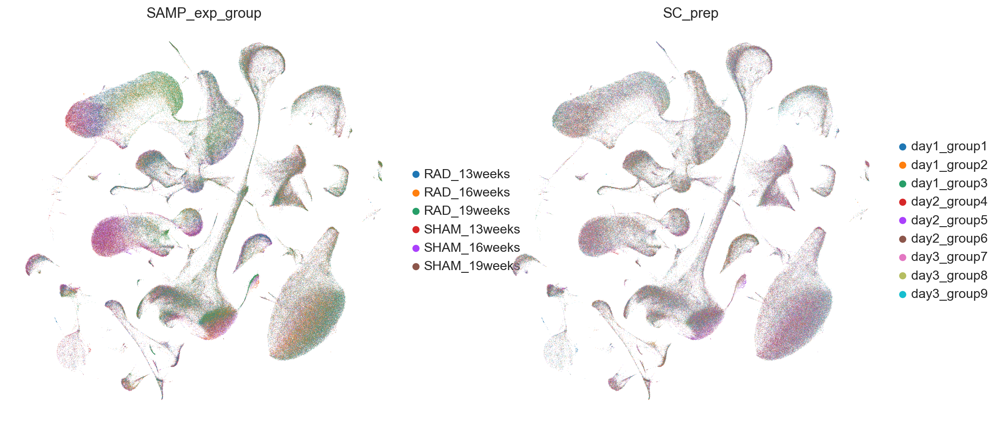

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


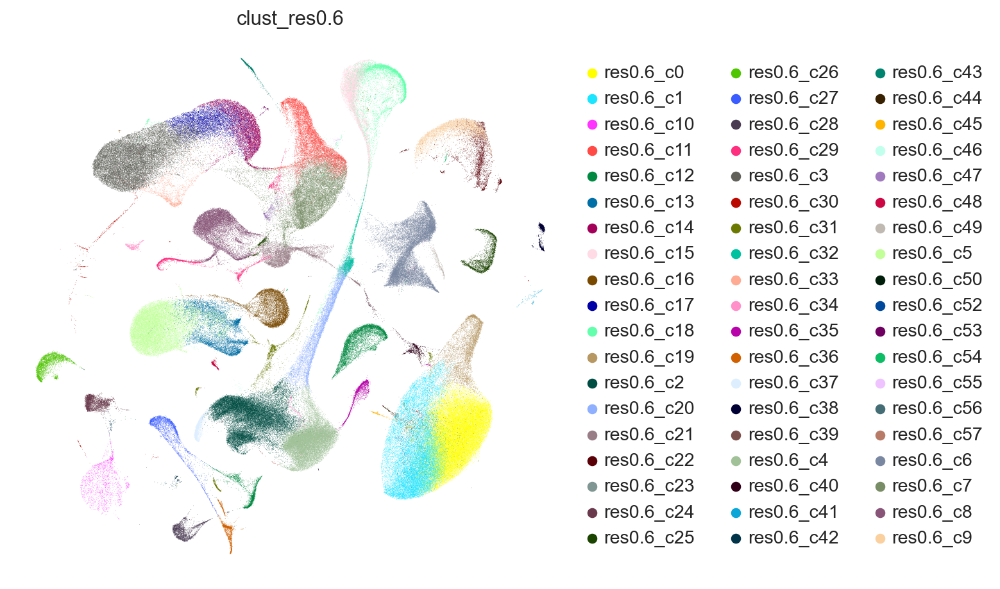

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


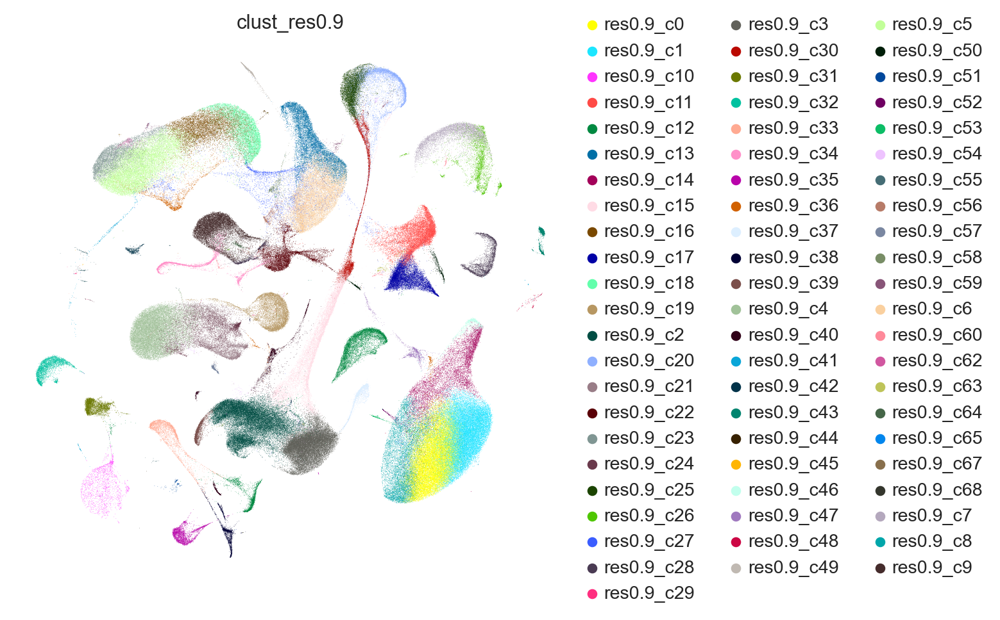

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


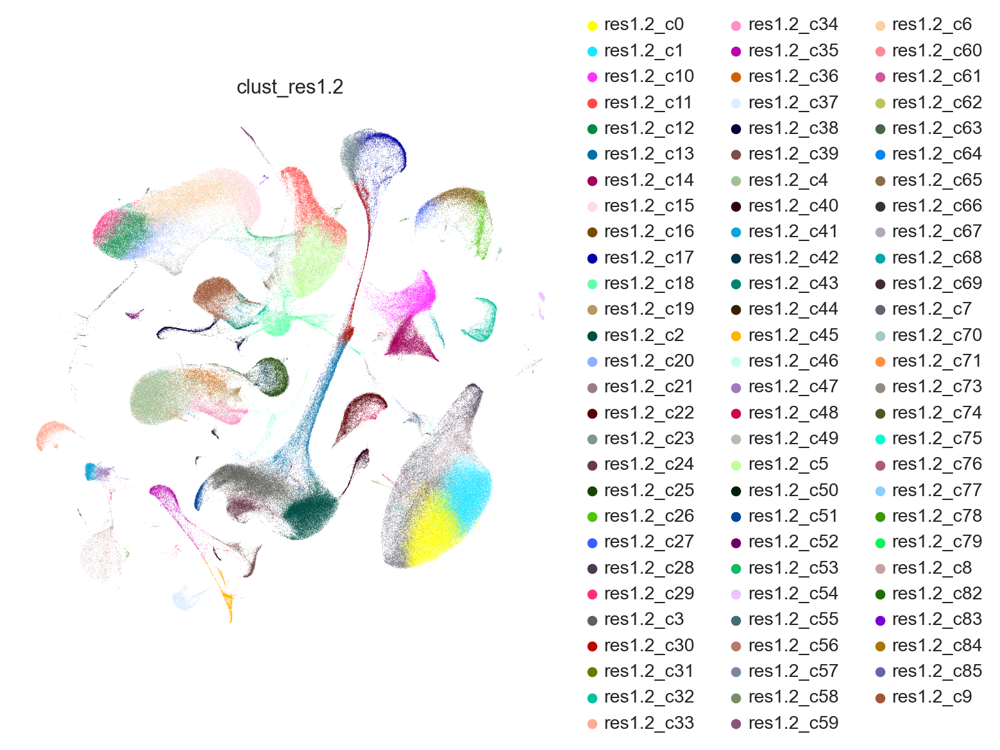

/home/h/hollenberg/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


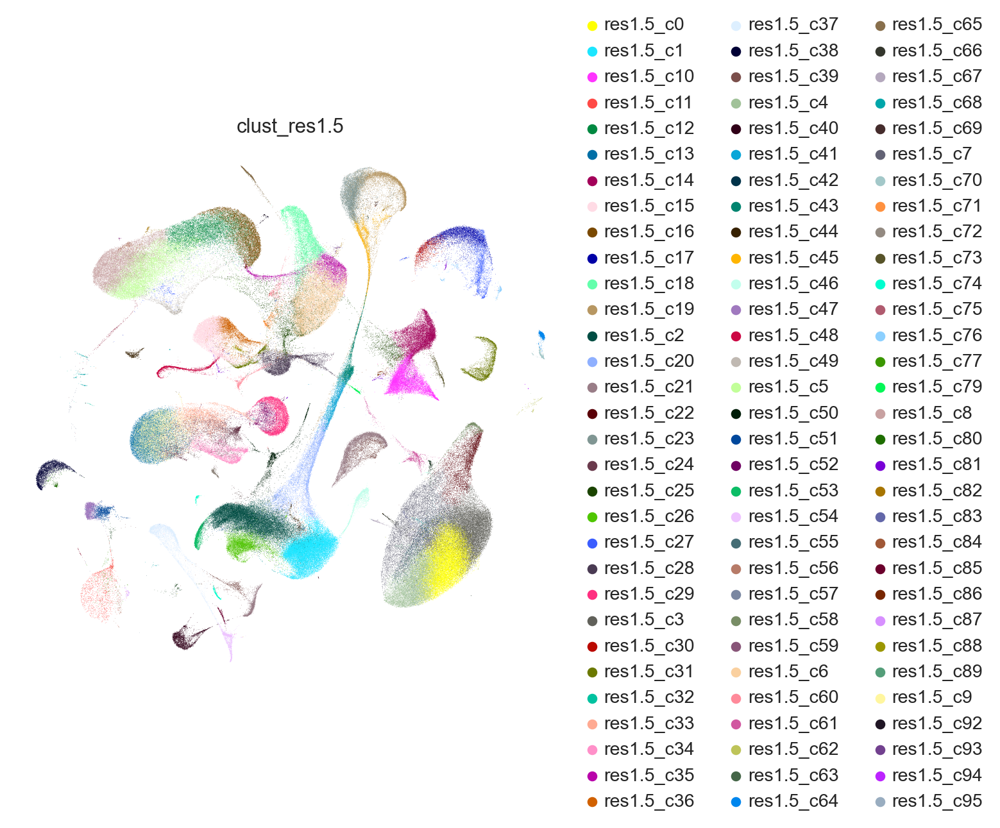

In [37]:
sc.pl.umap(adata=adata, color=["total_counts", "ident"])
sc.pl.umap(adata=adata, color=['Phase', 'DF_call_10pct'])
sc.pl.umap(adata=adata, color=['tube_ID'])
sc.pl.umap(adata=adata, color=['SAMP_ID'])
sc.pl.umap(adata=adata, color=['SAMP_condition', 'SAMP_stage'])
sc.pl.umap(adata=adata, color=['SAMP_exp_group', 'SC_prep'])
sc.pl.umap(adata=adata, color=['clust_res0.6'])
sc.pl.umap(adata=adata, color=['clust_res0.9'])
sc.pl.umap(adata=adata, color=['clust_res1.2'])
sc.pl.umap(adata=adata, color=['clust_res1.5'])

In [81]:
#adata.write("/home/h/hollenberg/MaPra/adata_processed_2_lea.h5ad")